In [1]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import matplotlib.pyplot as plt

In [2]:
if torch.cuda.device_count() > 1:
    device = torch.device("cuda:0")
    print("Training on multiple GPUs:", torch.cuda.device_count())
else:
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    print("Training on a single GPU:", device)

Training on multiple GPUs: 2


In [3]:
batch_size = 128
noise_dim = 100
base_filter = 128
color_channels = 3

In [4]:
def show_tensor_images(image_tensor, num_images=25, size=(3, 64, 64)):
    image_tensor = (image_tensor + 1) / 2
    image_unflat = image_tensor.detach().cpu()
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

In [5]:
def Generator(noise_dim, base_filter, color_channels):

    generator_model = nn.Sequential(
        nn.ConvTranspose2d(noise_dim, base_filter*8, kernel_size=4, stride=1, padding=0),
        nn.BatchNorm2d(base_filter*8),
        nn.ReLU(True),
        nn.ConvTranspose2d(base_filter*8, base_filter*4, kernel_size=4, stride=2, padding=1),
        nn.BatchNorm2d(base_filter*4),
        nn.ReLU(True),
        nn.ConvTranspose2d(base_filter*4, base_filter*2, kernel_size=4, stride=2, padding=1),
        nn.BatchNorm2d(base_filter*2),
        nn.ReLU(True),
        nn.ConvTranspose2d(base_filter*2, base_filter, kernel_size=4, stride=2, padding=1),
        nn.BatchNorm2d(base_filter),
        nn.ReLU(True),
        nn.ConvTranspose2d(base_filter, color_channels, kernel_size=4, stride=2, padding=1),
        nn.Tanh(),
    )
    
    return generator_model

In [6]:
def Discriminator(base_filter, color_dimensions):

    discriminator_model = nn.Sequential(
        nn.Conv2d(color_channels, base_filter, kernel_size=4, stride=2, padding=1),
        nn.LeakyReLU(0.2, inplace=True),
        nn.Conv2d(base_filter, base_filter*2, kernel_size=4, stride=2, padding=1),
        nn.BatchNorm2d(base_filter*2),
        nn.LeakyReLU(0.2, inplace=True),
        nn.Conv2d(base_filter*2, base_filter*4, kernel_size=4, stride=2, padding=1),
        nn.BatchNorm2d(base_filter*4),
        nn.LeakyReLU(0.2, inplace=True),
        nn.Conv2d(base_filter*4, base_filter*8, kernel_size=4, stride=2, padding=1),
        nn.BatchNorm2d(base_filter*8),
        nn.LeakyReLU(0.2, inplace=True),
        nn.Conv2d(base_filter*8, 1, kernel_size=4, stride=1, padding=0),
        nn.Sigmoid()
    )

    return discriminator_model

In [7]:
generator = Generator(noise_dim, base_filter, color_channels).to(device)  
discriminator = Discriminator(base_filter, color_channels).to(device)

In [8]:
generator = nn.DataParallel(generator)
discriminator = nn.DataParallel(discriminator)

In [9]:
def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
        torch.nn.init.constant_(m.bias, 0)

In [10]:
generator.apply(weights_init)
discriminator.apply(weights_init)

DataParallel(
  (module): Sequential(
    (0): Conv2d(3, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (6): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(512, 1024, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (9): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(1024, 1, kernel_size=(4, 4), stride=(1, 1))
    (12): Sigmoid()
  )
)

In [11]:
criterion = nn.BCELoss()
lr = 0.0002
momentum = 0.5

In [12]:
transform = transforms.Compose([
    transforms.Resize((64, 64)),  # Resize images to 64x64
    transforms.ToTensor(),   # Convert to tensor
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])  # Normalize to range [-1, 1]
])

In [13]:
root_dir = '/kaggle/input/oxford-102-category-flower-dataset'
flowers_dataset = ImageFolder(root=root_dir, transform=transform)

In [14]:
dataloader = DataLoader(flowers_dataset,batch_size=batch_size,shuffle=True)

In [15]:
optimizerG = torch.optim.Adam(generator.parameters(), lr=lr, betas=(momentum, 0.999))
optimizerD = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(momentum, 0.999))

In [16]:
num_epochs = 100
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("Training on", device)

Training on cuda:0


Epoch 7, step 500


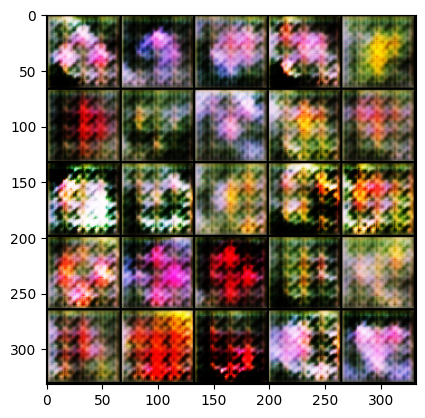

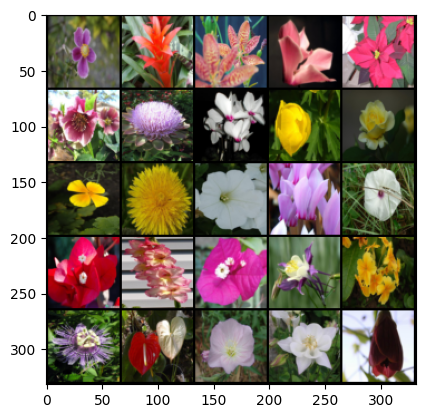

Epoch 15, step 1000


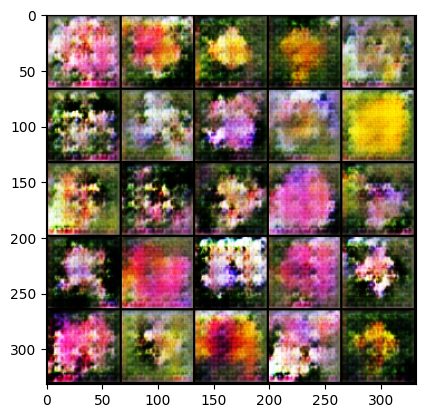

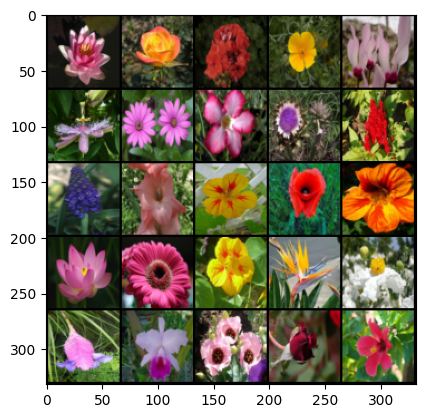

Epoch 23, step 1500


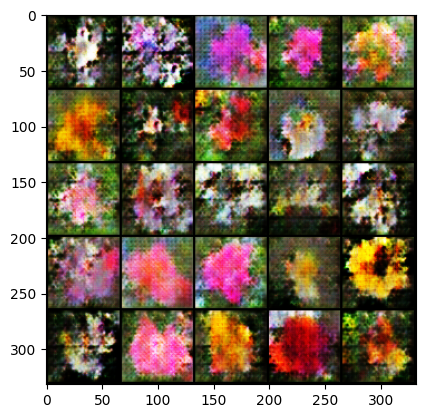

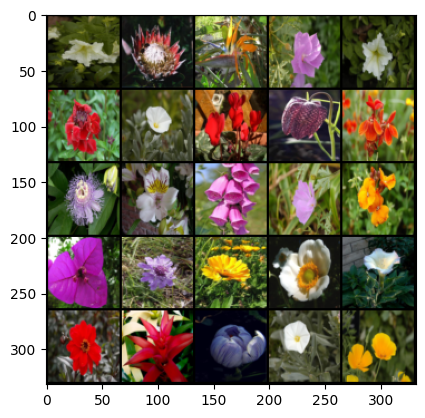

Epoch 31, step 2000


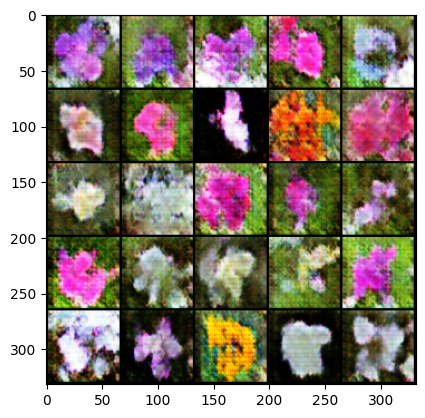

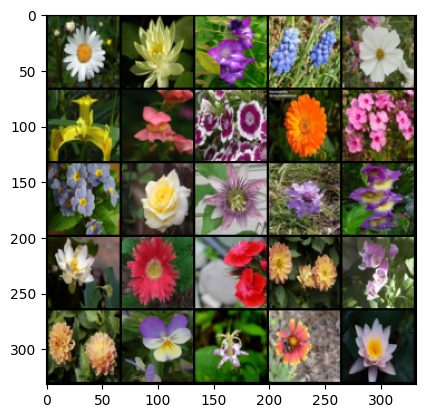

Epoch 39, step 2500


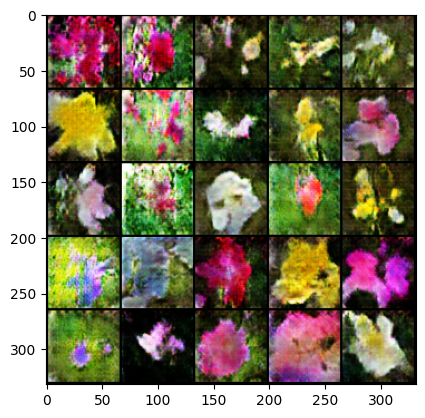

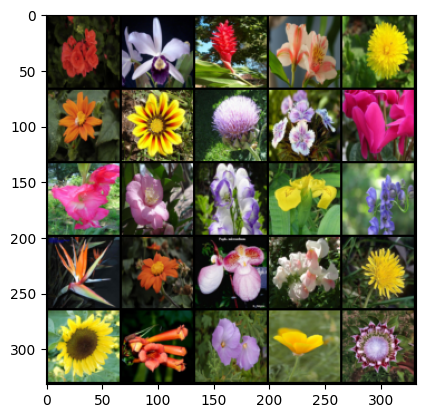

Epoch 46, step 3000


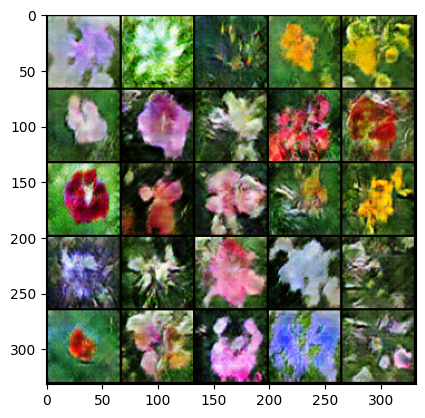

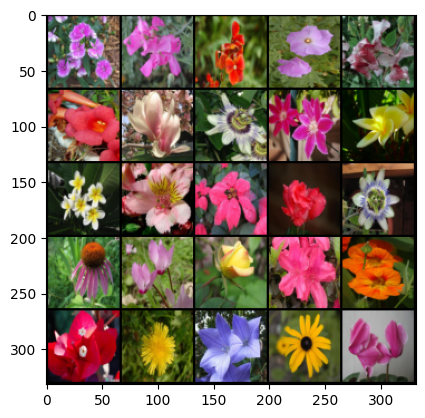

Epoch 54, step 3500


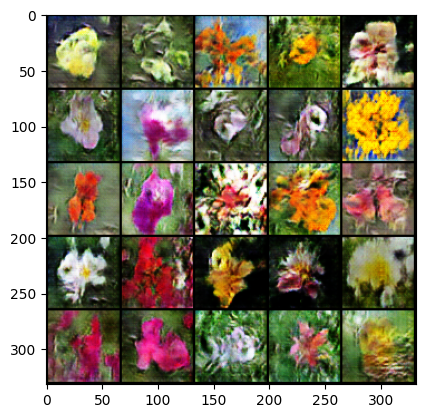

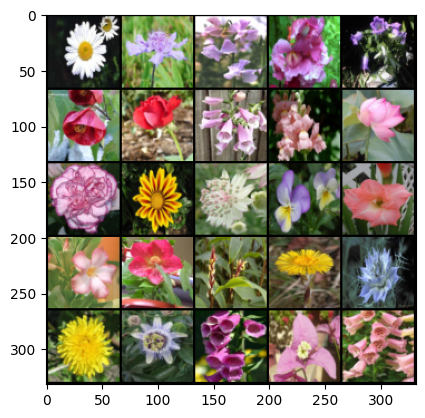

Epoch 62, step 4000


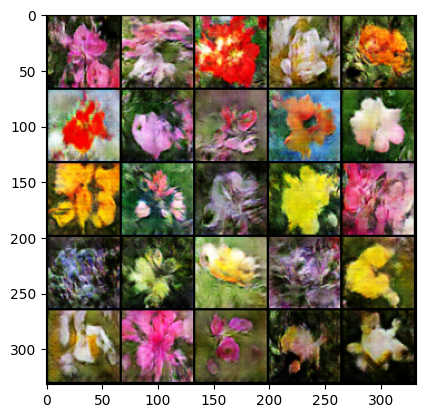

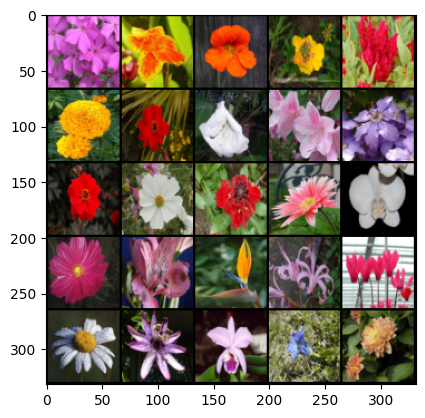

Epoch 70, step 4500


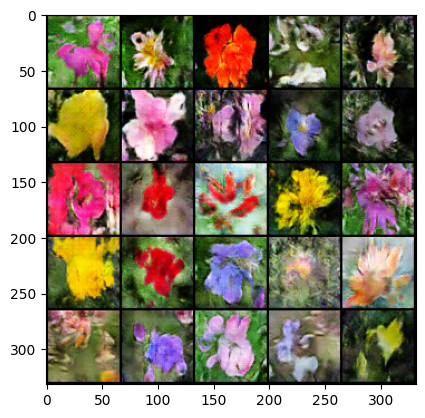

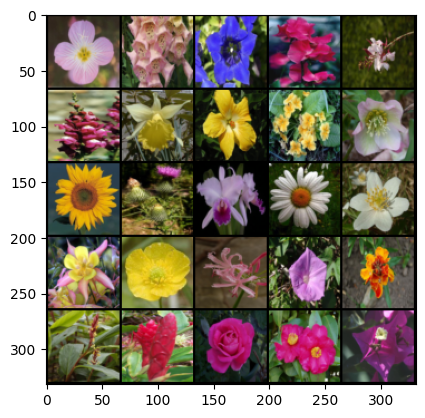

Epoch 78, step 5000


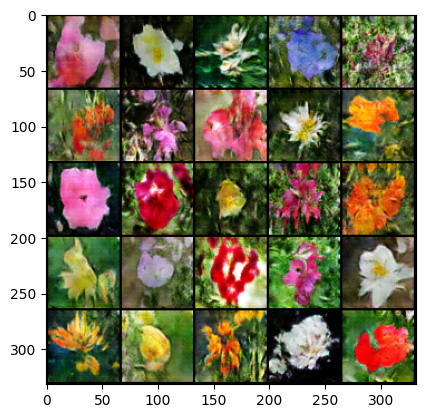

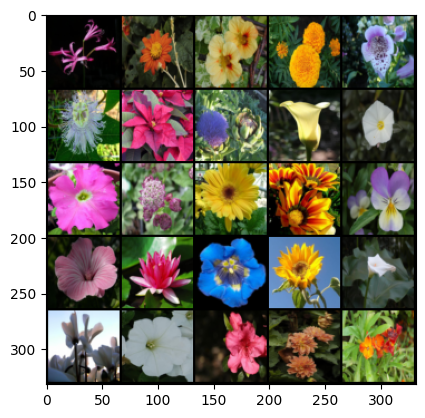

Epoch 85, step 5500


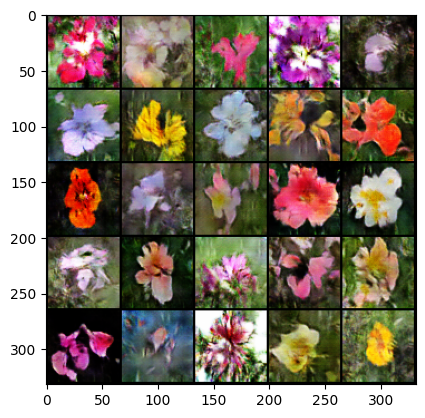

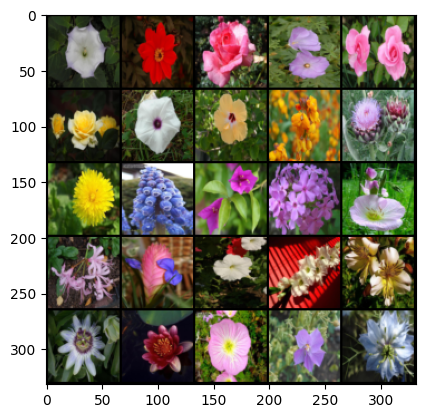

Epoch 93, step 6000


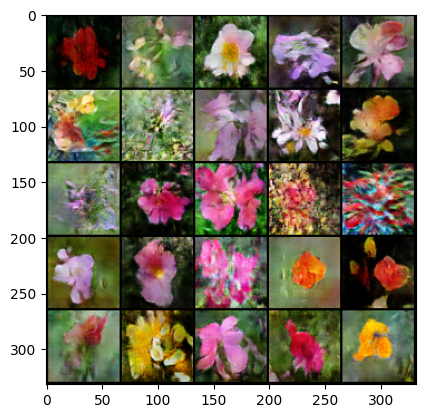

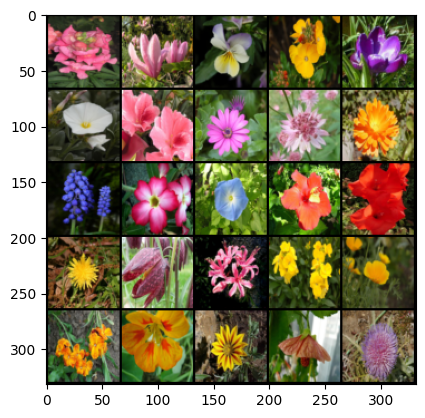

Epoch 99, step 6399


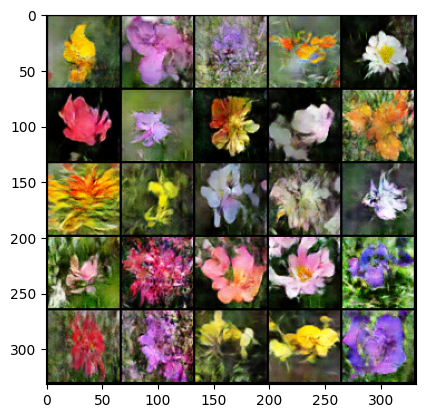

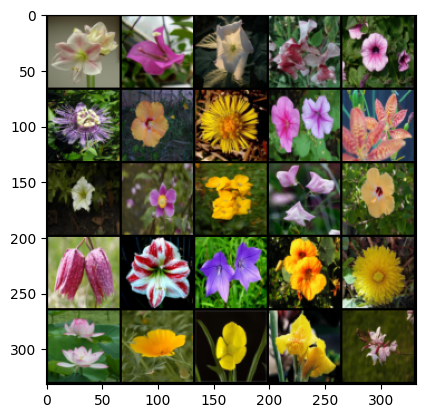

In [17]:
cur_step = 0
display_step = 500
for epoch in range(num_epochs):
    for i, data in enumerate(dataloader, 0):
        real_images, _ = data
        real_images = real_images.to(device)
        batch_size = real_images.size(0)

        # Discriminator update: maximize log(D(x)) + log(1 - D(G(z)))
        discriminator.zero_grad()
        label = torch.full((batch_size,), 1.0, device=device)  # Real labels
        output_real = discriminator(real_images).view(-1)
        errD_real = criterion(output_real, label)
        errD_real.backward()

        noise = torch.randn(batch_size, noise_dim, 1, 1, device=device)
        fake_images = generator(noise)
        label.fill_(0.0)  # Fake labels
        output_fake = discriminator(fake_images.detach()).view(-1)
        errD_fake = criterion(output_fake, label)
        errD_fake.backward()
        errD = errD_real + errD_fake
        optimizerD.step()

        # Generator update: maximize log(D(G(z)))
        generator.zero_grad()
        label.fill_(1.0)  # Real labels (generator wants discriminator to think the images are real)
        output = discriminator(fake_images).view(-1)
        errG = criterion(output, label)
        errG.backward()
        optimizerG.step()

        if (cur_step % display_step == 0 and cur_step > 0):
            print(f"Epoch {epoch}, step {cur_step}")
            show_tensor_images(fake_images)
            show_tensor_images(real_images)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1
    if epoch == num_epochs-1:
        print(f"Epoch {epoch}, step {cur_step-1}")
        show_tensor_images(fake_images)
        show_tensor_images(real_images)